__Student:__  Imane SI SALAH (imane.si_salah@ens-paris-saclay.fr)

In [1]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.signal import hamming
from scipy.spatial.distance import cdist
from scipy.signal import find_peaks

import IPython.display as ipd
from mdct.fast import mdct, imdct



plt.rcParams['figure.figsize'] = (12,8)

In [2]:
# useful functions

def plot_sound(data, rate, title=None):
    if data.ndim == 1:
        data = data[:,np.newaxis]
    times = np.arange(data.shape[0])/rate
    plt.figure(figsize=(30,6))
    for channel in data.T:
        plt.fill_between(times, channel)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.xlim(times[0], times[-1])
    if title:
        plt.title(title)
    plt.show()
    
def play_sound(data, rate):
    return ipd.Audio(data.T, rate=rate)

T = 220501, M = 2


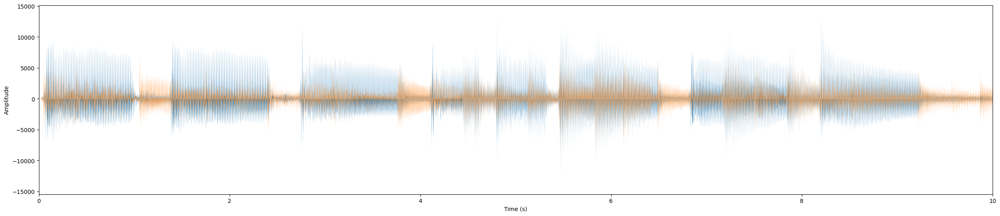

In [3]:
fname = 'mix.wav'

rate, x = wavfile.read(fname)
print('T = {:d}, M = {:d}'.format(*x.shape))
plot_sound(x, rate)
play_sound(x, rate)

In [4]:
print('x is of dimension (T x M):', x.shape)

x is of dimension (T x M): (220501, 2)


__Question 1:__ Open file mix.wav and load it in a T × M matrix x(t, m), where M = 2 and T is the number of samples. Use your headphones to listen to the mixture. What is the number K of instruments that you can hear? From which direction do you perceive them?

__Answer__:
From the audio I hear 3 instruments, I hear one from the right, one from the left and one I would assume from the front


__Question 2:__ Plot the temporal dispersion diagram, defined as the set of points in the plane of coordinates (x(t, 1), x(t, 2)) for all t (in order to plot a set of points, you can use function plot with parameter ’x’, and you can normalize the axes with the instruction axis equal). Can you distinguish the directions of the sources?

__Answer:__

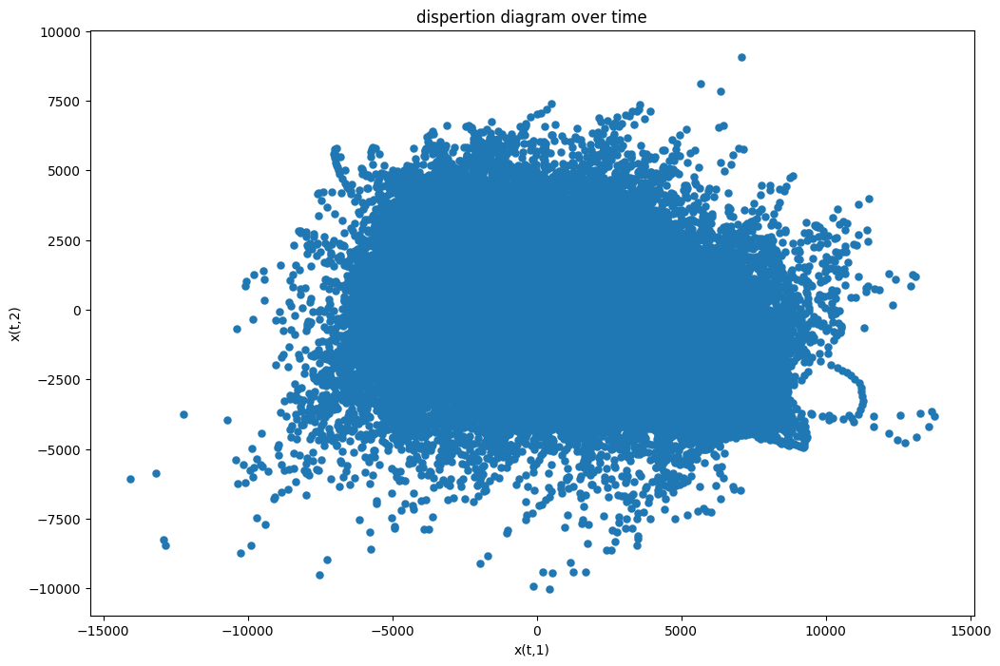

In [5]:
plt.scatter(x[:,0], x[:,1], linewidths=0.1)
plt.xlabel('x(t,1)')
plt.ylabel('x(t,2)')
plt.title('dispertion diagram over time')
plt.show()

we see that we cannot distinguish between the souces

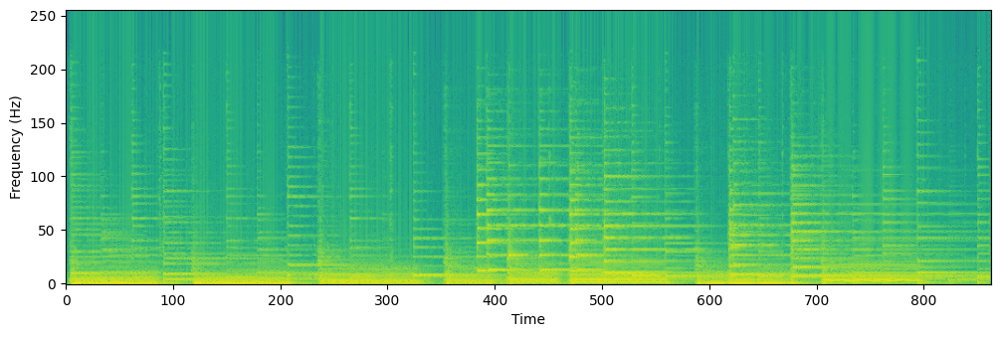

In [6]:
X = mdct(x, window=hamming, framelength=512)
Z = X.view(dtype=np.complex128)[...,0]

X_norm = np.abs(Z)**2

plt.imshow(np.log(X_norm+1e-10), origin='lower')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show()

In [7]:
from mdct.fast import mdct, imdct
X = mdct(x, window=hamming, framelength=512)
xx = imdct(X, window=hamming, framelength=512)
print(xx.shape)

(220501, 2)


c:\Users\imane\MVA\audio signal indexing\TP3\.venv\lib\site-packages\stft\utils.py:53: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]
c:\Users\imane\MVA\audio signal indexing\TP3\.venv\lib\site-packages\stft\utils.py:25: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]


__Question4:__ Plot the time-frequency dispersion diagram, defined as the set of points in the plane of affix Z( f; n)
for all f and n. Can you distinguish the directions of the sources? How do you explain it?

Text(0.5, 1.0, 'Dispersion diagram in TF domain')

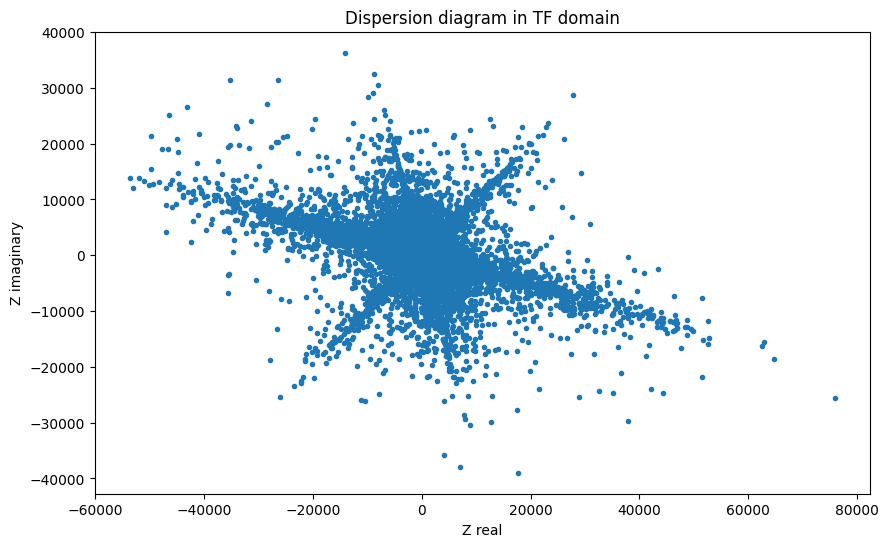

In [8]:
plt.figure(figsize=(10,6))
plt.scatter(Z.real, Z.imag, marker='.')
plt.xlabel('Z real')
plt.ylabel('Z imaginary')
plt.title('Dispersion diagram in TF domain')

we can distinguish 3 axis which correspond to the 3 sources we mentionned earlier

__Question 5__ Plot the histogram of the arguments of the points of affix Z(f, n) for all f and n (you can use
function atan to compute the arguments modulo π, between −π/2 and +π/2, and function hist to compute the histogram, whose number of classes has to be tuned so as to make the directions of the sources clearly visible). Estimate the angles θ(k) (you can determine these values graphically
from the histogram).


C:\Users\imane\AppData\Local\Temp\ipykernel_61312\4199723792.py:2: RuntimeWarning: invalid value encountered in true_divide
  arguments= np.arctan(Z.imag/Z.real)


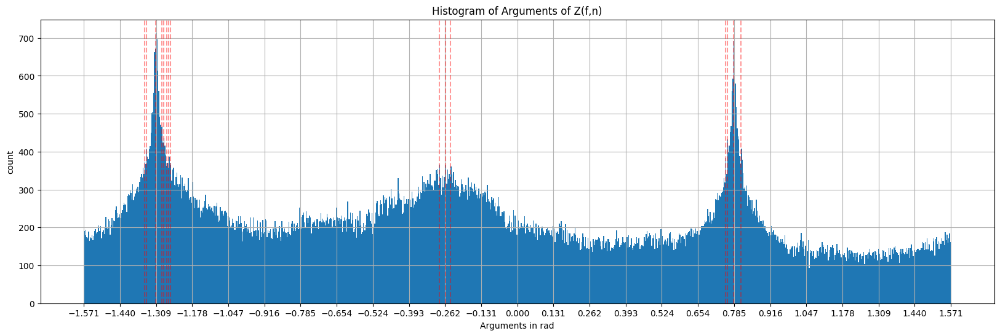

In [9]:
#check histogram de la phase*
arguments= np.arctan(Z.imag/Z.real)
arguments_f= arguments[~np.isnan(arguments)].flatten()

plt.figure(figsize=(20,6))
hist, bins, _= plt.hist(arguments_f, bins=1000 )
peaks,_= find_peaks(hist, height=360)

for pos in peaks:
    plt.axvline(bins[pos], color='red',  linestyle='--', alpha=0.4)

plt.xticks(np.linspace(-np.pi/2, np.pi/2, 25))
plt.xlabel('Arguments in rad')
plt.ylabel('count')
plt.title('Histogram of Arguments of Z(f,n)')
plt.grid(True) 
plt.show()

We can distinguish 3 peak graphically  at $\theta_k \approx [-1.3, -0.26, 0.78] rad$  approximately equivalent to [-74.48° -14.89° 0.78°]

__Question 6: __ In order to estimate the active source at every time-frequency bin ( f; n), you can look for the source
k whose angle $\theta (k)$ is closest to the argument of $Z( f; n)$, modulo $\pi$ (you can use a deviation measure
invariant modulo $\pi$, for instance j $sin (\theta (k) 􀀀 \Z( f; n)) j$). Then generate the binary masks B 2 f0; 1g,
such that $B( f; n; k)$ is equal to 1 if source k is active at $( f; n)$, or 0 otherwise.

In [10]:
thetas=[-1.3, -0.26, 0.78]
F= Z.shape[0]
N= Z.shape[1]
K=3

B= np.zeros((F,N,K))

for f in range (F):
    for n in range(N):
        diff= np.abs(np.sin(thetas- arguments[f,n]))
        k= np.argmin(diff) #get the active source
        B[f,n,k]=1

Text(0.5, 1.0, 'source 3')

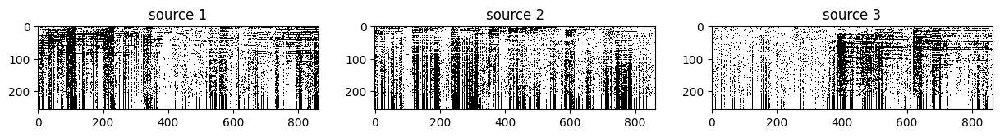

In [11]:
#attempt to visualize these binary masks
fig, axs= plt.subplots(1,3, figsize=(15,10))
axs[0].imshow(B[:,:,0], cmap='binary', interpolation='nearest')
axs[0].set_title('source 1')

axs[1].imshow(B[:,:,1], cmap='binary', interpolation='nearest')
axs[1].set_title('source 2')

axs[2].imshow(B[:,:,2], cmap='binary', interpolation='nearest')
axs[2].set_title('source 3')


We can somehow see that the sources are not all active at the same time for a given frequency sub-band

__Question 7:__ Apply masks B to the MDCT X( f; n;m) in order to estimate the MDCT of the stereophonic images
Y( f; n;m; k). Then reconstruct the images y(t;m; k) of the source signals by applying the inverse
MDCT (you can use the Matlab function iwmdct or the Python function imdct).

In [12]:
M=2
Y= np.zeros((F,N,M,K))
for k in range(K):
    Y[:,:,0,k]= X[:,:,0]* B[:,:,k]
    Y[:,:,1,k]= X[:,:,1]* B[:,:,k]

In [13]:
#recosntruct the time domain signal:
y= np.zeros((220672,M,K))
for k in range(K):
    y[:,0,k]= imdct(Y[:,:,0,k],window=hamming, framelength=512)
    y[:,1,k]= imdct(Y[:,:,1,k],window=hamming, framelength=512)

__Question 8:__ Listen to the K reconstructed stereophonic images y(:; :; k). What defects can you perceive?

In [14]:
print('\n Source 1:')
ipd.display(play_sound(y[...,0], rate))
print('\n Source 2:')
ipd.display(play_sound(y[...,1], rate))
print('\n Source 3:')
ipd.display(play_sound(y[...,2], rate))




 Source 1:



 Source 2:



 Source 3:


We see that the sources are correctly separated, althogh the resulting signals are not clean, there is some noise 

__Question9:__. Compute the MMSE estimator S ( f; n; k) of source k. Reconstruct the source signals s(t; k) by
applying the inverse MDCT to S ( f; n; k). Listen to the result.

In [15]:
A=np.array([np.cos(thetas), np.sin(thetas)] )

S= np.zeros((F,N,M,K))
for k in range(K):
    S[:,:,:,k]= Y[:,:,:,k]* A[:,k]/np.linalg.norm(A[:,k], ord=2)**2


In [16]:
s= np.zeros((220672,M,K))
for k in range(K):
    s[:,:,k]= imdct(S[:,:,:,k],window=hamming, framelength=512)


In [17]:
print('\n Source 1:')
ipd.display(play_sound(s[...,0], rate))
print('\n Source 2:')
ipd.display(play_sound(s[...,1], rate))
print('\n Source 3:')
ipd.display(play_sound(s[...,2], rate))


 Source 1:



 Source 2:



 Source 3:


the noise is slightly reduced but it is still there.

__Question 10:__ We now wish to respatialize the sources, i.e. to resynthesize the mixture x(t;m) by modifying the
angles $\theta(k)$ (remark that it is not needed to switch back to the MDCT domain). For instance, try to
permute the directions of the sources. Listen to the result. What audible defects can you notice?

__Answer__
we apply a permutation matrix to the each of the sources separatly and observe its effect:

The permutaion matrix: 
$$
\begin{bmatrix}
\cos \alpha & -\sin \alpha \\
\sin \alpha & \cos \alpha
\end{bmatrix}
$$

In [18]:
s_per= np.copy(s)
thetas_new= [- theta for theta in thetas]
coeffs= np.array([[np.cos(thetas_new), -np.sin(thetas_new)], 
                  [np.sin(thetas_new), np.cos(thetas_new)]])


for k in range(K):
    s_per[:,:,k]=np.dot(s_per[:, :, k],coeffs[:,:,k])

mixed_per = s_per.sum(axis=2)

print('\n Source 1:')
ipd.display(play_sound(s_per[...,0], rate))
print('\n Source 2:')
ipd.display(play_sound(s_per[...,1], rate))
print('\n Source 3:')
ipd.display(play_sound(s_per[...,2], rate))

print("\n\nThe rotated Audio:")
ipd.display(play_sound(mixed_per, rate))

print("The original Audio for comparison:")
ipd.display(play_sound(x, rate))


 Source 1:



 Source 2:



 Source 3:




The rotated Audio:


The original Audio for comparison:
